# Setup
1. In colab: Go to "Runtime" -> "Change runtime type" -> Select "T4 GPU"
2. Install TerraTorch

In [1]:
!pip install terratorch==1.0.1 gdown tensorboard


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [4]:
import os
import sys
import torch
import gdown
import terratorch
import albumentations
import lightning.pytorch as pl
import matplotlib.pyplot as plt
from terratorch.datamodules import MultiTemporalCropClassificationDataModule
import warnings
warnings.filterwarnings('ignore')

3. Download the dataset from Google Drive

In [6]:
# Download a random subset for demos (~1 GB)
if not os.path.isfile('multi-temporal-crop-classification-subset.tar.gz'):
    gdown.download("https://drive.google.com/uc?id=1SycflNslu47yfMg2i_z8FqYkhZQv7JQM")

if not os.path.isdir('multi-temporal-crop-classification-subset/'):
    !tar -xzvf multi-temporal-crop-classification-subset.tar.gz

dataset_path = "multi-temporal-crop-classification-subset"

Downloading...
From (original): https://drive.google.com/uc?id=1SycflNslu47yfMg2i_z8FqYkhZQv7JQM
From (redirected): https://drive.google.com/uc?id=1SycflNslu47yfMg2i_z8FqYkhZQv7JQM&confirm=t&uuid=25a72a79-c32d-493b-b1cf-d361841a926d
To: /opt/app-root/src/terratorch/examples/tutorials/PrithviEOv2/multi-temporal-crop-classification-subset.tar.gz
100%|██████████| 1.09G/1.09G [00:23<00:00, 46.4MB/s]

multi-temporal-crop-classification-subset/
multi-temporal-crop-classification-subset/._.DS_Store
tar: Ignoring unknown extended header keyword 'SCHILY.fflags'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.FinderInfo'
multi-temporal-crop-classification-subset/.DS_Store
multi-temporal-crop-classification-subset/._training_chips
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/training_chips/
multi-temporal-crop-classification-subset/._validation_chips
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/validation_chips/
multi-temporal-crop-classification-subset/._training_data.txt
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.provenance'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.metadata:kMDLabel_bp7lphfqfrx4tmrnekvg6mbqxu'
tar: Ignoring unknown ext

multi-temporal-crop-classification-subset/validation_chips/._chip_270_263.mask.tif
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/validation_chips/chip_270_263.mask.tif
multi-temporal-crop-classification-subset/validation_chips/._chip_250_258.mask.tif
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/validation_chips/chip_250_258.mask.tif
multi-temporal-crop-classification-subset/validation_chips/._chip_128_445.mask.tif
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/validation_chips/chip_128_445.mask.tif
multi-temporal-crop-classification-subset/validation_chips/._chip_242_597_merged.tif
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
multi-temporal-crop-classification-subset/validation_chips/chip_242_597_merged.

## Multi-temporal Crop Dataset

Lets start with analyzing the dataset


In [7]:
!ls "{dataset_path}"

training_chips	training_data.txt  validation_chips  validation_data.txt


In [8]:
# Each merged sample includes the stacked bands of three time steps
!ls "{dataset_path}/training_chips" | head

chip_003_062.mask.tif
chip_003_062_merged.tif
chip_003_063.mask.tif
chip_003_063_merged.tif
chip_010_063.mask.tif
chip_010_063_merged.tif
chip_019_091.mask.tif
chip_019_091_merged.tif
chip_022_126.mask.tif
chip_022_126_merged.tif
ls: write error: Broken pipe


In [9]:
# Adjusted dataset class for this dataset (general dataset could be used as well)
datamodule = MultiTemporalCropClassificationDataModule(
    batch_size=8,
    num_workers=2,
    data_root=dataset_path,
    train_transform=[
        terratorch.datasets.transforms.FlattenTemporalIntoChannels(),  # Required for temporal data
        albumentations.D4(), # Random flips and rotation
        albumentations.pytorch.transforms.ToTensorV2(),
        terratorch.datasets.transforms.UnflattenTemporalFromChannels(n_timesteps=3),
    ],
    val_transform=None,  # Using ToTensor() by default
    test_transform=None,
    expand_temporal_dimension=True,
    use_metadata=False, # The crop dataset has metadata for location and time
    reduce_zero_label=True,
)

# Setup train and val datasets
datamodule.setup("fit")

In [10]:
# checking for the dataset means and stds
datamodule.means, datamodule.stds

([494.905781, 815.239594, 924.335066, 2968.881459, 2634.621962, 1739.579917],
 [284.925432, 357.84876, 575.566823, 896.601013, 951.900334, 921.407808])

In [11]:
# checking datasets train split size
train_dataset = datamodule.train_dataset
len(train_dataset)

462

In [12]:
# checking datasets available bands
train_dataset.all_band_names

('BLUE', 'GREEN', 'RED', 'NIR_NARROW', 'SWIR_1', 'SWIR_2')

In [13]:
# checking datasets classes
train_dataset.class_names

('Natural Vegetation',
 'Forest',
 'Corn',
 'Soybeans',
 'Wetlands',
 'Developed / Barren',
 'Open Water',
 'Winter Wheat',
 'Alfalfa',
 'Fallow / Idle Cropland',
 'Cotton',
 'Sorghum',
 'Other')

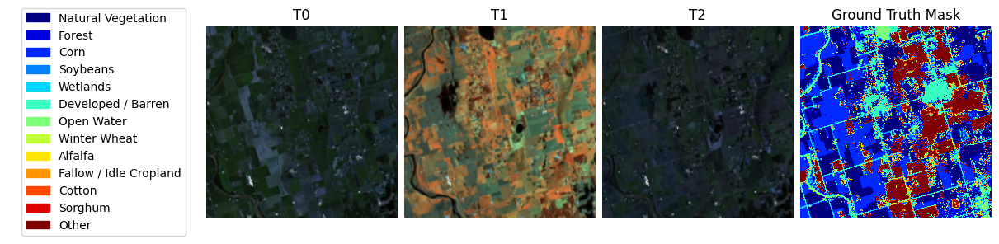

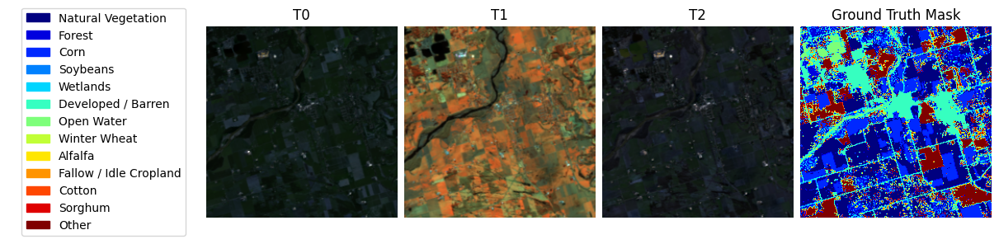

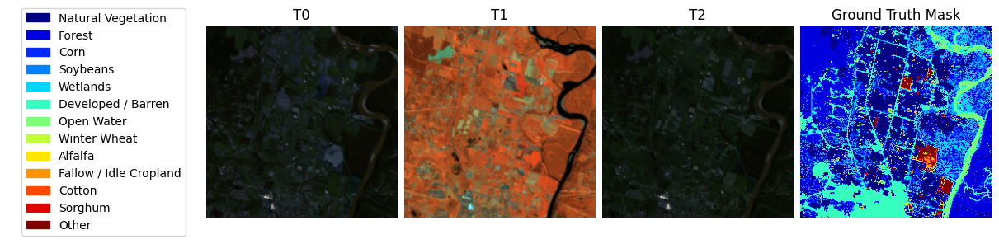

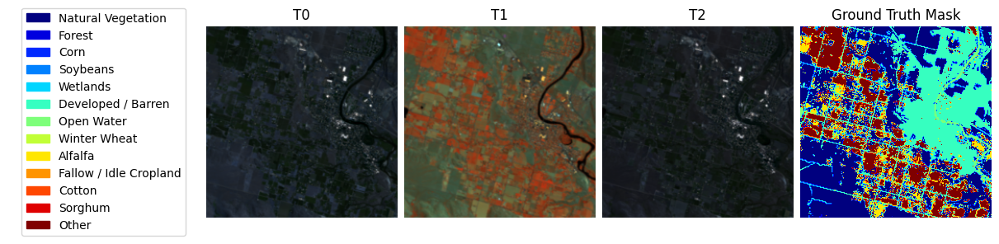

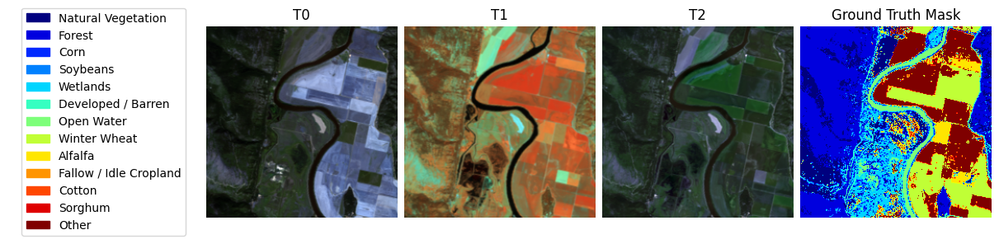

In [14]:
# plotting a few samples
for i in range(5):
    train_dataset.plot(train_dataset[i])

In [15]:
# checking datasets validation split size
val_dataset = datamodule.val_dataset
len(val_dataset)

250

In [16]:
# checking datasets testing split size
datamodule.setup("test")
test_dataset = datamodule.test_dataset
len(test_dataset)

250

# Fine-tune Prithvi

In [17]:
pl.seed_everything(0)

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    dirpath="output/multicrop/checkpoints/",
    mode="max",
    monitor="val/Multiclass_Jaccard_Index", # Variable to monitor
    filename="best-{epoch:02d}",
)

# Lightning Trainer
trainer = pl.Trainer(
    accelerator="auto",
    strategy="auto",
    devices=1, # Lightning multi-gpu often fails in notebooks
    precision='bf16-mixed',  # Speed up training
    num_nodes=1,
    logger=True, # Uses TensorBoard by default
    max_epochs=1, # For demos
    log_every_n_steps=5,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback, pl.callbacks.RichProgressBar()],
    default_root_dir="output/multicrop",
)

# Model
model = terratorch.tasks.SemanticSegmentationTask(
    model_factory="EncoderDecoderFactory",
    model_args={
        # Backbone
        "backbone": "prithvi_eo_v2_300_tl", # Model can be either prithvi_eo_v1_100, prithvi_eo_v2_300, prithvi_eo_v2_300_tl, prithvi_eo_v2_600, prithvi_eo_v2_600_tl
        "backbone_pretrained": True,
        "backbone_num_frames": 3,
        "backbone_bands": ["BLUE", "GREEN", "RED", "NIR_NARROW", "SWIR_1", "SWIR_2"],
        "backbone_coords_encoding": [], # use ["time", "location"] for time and location metadata
        
        # Necks 
        "necks": [
            {
                "name": "SelectIndices",
                # "indices": [2, 5, 8, 11] # indices for prithvi_eo_v1_100
                "indices": [5, 11, 17, 23] # indices for prithvi_eo_v2_300
                # "indices": [7, 15, 23, 31] # indices for prithvi_eo_v2_600
            },
            {
                "name": "ReshapeTokensToImage",
                "effective_time_dim": 3
            },
            {"name": "LearnedInterpolateToPyramidal"},            
        ],
        
        # Decoder
        "decoder": "UNetDecoder",
        "decoder_channels": [512, 256, 128, 64],
        
        # Head
        "head_dropout": 0.1,
        "num_classes": 13,
    },
    
    loss="ce",
    lr=1e-4,
    optimizer="AdamW",
    ignore_index=-1,
    freeze_backbone=True,  # Speeds up fine-tuning
    freeze_decoder=False,
    plot_on_val=True,
    
)

Seed set to 0
Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


config.json:   0%|          | 0.00/776 [00:00<?, ?B/s]

Prithvi_EO_V2_300M_TL.pt:   0%|          | 0.00/1.33G [00:00<?, ?B/s]

INFO:root:Loaded weights for HLSBands.BLUE in position 0 of patch embed
INFO:root:Loaded weights for HLSBands.GREEN in position 1 of patch embed
INFO:root:Loaded weights for HLSBands.RED in position 2 of patch embed
INFO:root:Loaded weights for HLSBands.NIR_NARROW in position 3 of patch embed
INFO:root:Loaded weights for HLSBands.SWIR_1 in position 4 of patch embed
INFO:root:Loaded weights for HLSBands.SWIR_2 in position 5 of patch embed


In [19]:
# Training
trainer.fit(model, datamodule=datamodule)

You are using a CUDA device ('NVIDIA H100 PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┓
┃   ┃ Name          ┃ Type             ┃ Params ┃ Mode  ┃
┡━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━┩
│ 0 │ model         │ PixelWiseModel   │  383 M │ train │
│ 1 │ criterion     │ CrossEntropyLoss │      0 │ train │
│ 2 │ train_metrics │ MetricCollection │      0 │ train │
│ 3 │ val_metrics   │ MetricCollection │      0 │ train │
│ 4 │ test_metrics  │ ModuleList       │      0 │ train │
└───┴───────────────┴──────────────────┴────────┴───────┘

Trainable params: 79.9 M                                                                                           
Non-trainable params: 303 M                                                                                        
Total params: 383 M                                                                                                
Total estimated model params size (MB): 1.5 K                                                                      
Modules in train mode: 617                                                                                         
Modules in eval mode: 0

Output()

`Trainer.fit` stopped: `max_epochs=1` reached.


In [20]:
best_ckpt_path = "output/multicrop/checkpoints/best-epoch=00.ckpt"

In [30]:
def run_test_and_plot(model, ckpt_path):

    # calculate test metrics
    trainer.test(model, datamodule=datamodule, ckpt_path=ckpt_path)

    # get predictions
    preds = trainer.predict(model, datamodule=datamodule, ckpt_path=ckpt_path)

    # get data 
    data_loader = trainer.predict_dataloaders
    batch = next(iter(data_loader))

    # plot
    BATCH_SIZE = 8
    for i in range(BATCH_SIZE):

        sample = {key: batch[key][i] for key in batch}
        sample["prediction"] = preds[0][0][0][i].cpu().numpy()

        datamodule.predict_dataset.plot(sample)
        

Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃             Test metric             ┃            DataLoader 0             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/Multiclass_Accuracy       │         0.3012286424636841          │
│      test/Multiclass_F1_Score       │         0.3012286424636841          │
│    test/Multiclass_Jaccard_Index    │         0.14951881766319275         │
│ test/Multiclass_Jaccard_Index_Micro │         0.17732146382331848         │
│              test/loss              │         2.2126657962799072          │
│      test/multiclassaccuracy_0      │         0.3821676969528198          │
│      test/multiclassaccuracy_1      │         0.3202829957008362          │
│     test/multiclassaccuracy_10      │        0.0006523437332361937        │
│     test/multiclassaccuracy_11      │        0.058042947202920914         │
│     test/multiclassaccuracy_12      │         0.1593455672264099          │
│      test/multiclassaccuracy_2      │         0.0600440539419651          │
│      test/multiclassaccuracy_3      │         0.46354344487190247         │
│      test/multiclassaccuracy_4      │         0.5412510633468628          │
│      test/multiclassaccuracy_5      │         0.4083462059497833          │
│      test/multiclassaccuracy_6      │         0.6408115029335022          │
│      test/multiclassaccuracy_7      │         0.4969947934150696          │
│      test/multiclassaccuracy_8      │         0.06320036202669144         │
│      test/multiclassaccuracy_9      │        0.0005465322756208479        │
│    test/multiclassjaccardindex_0    │         0.26557210087776184         │
│    test/multiclassjaccardindex_1    │         0.2047392874956131          │
│   test/multiclassjaccardindex_10    │        0.0006481062155216932        │
│   test/multiclassjaccardindex_11    │         0.04727495461702347         │
│   test/multiclassjaccardindex_12    │         0.09226714074611664         │
│    test/multiclassjaccardindex_2    │         0.05558066815137863         │
│    test/multiclassjaccardindex_3    │         0.17516542971134186         │
│    test/multiclassjaccardindex_4    │         0.2712050974369049          │
│    test/multiclassjaccardindex_5    │         0.1613265573978424          │
│    test/multiclassjaccardindex_6    │         0.43177253007888794         │
│    test/multiclassjaccardindex_7    │         0.20393230020999908         │
│    test/multiclassjaccardindex_8    │         0.0337165966629982          │
│    test/multiclassjaccardindex_9    │        0.0005438047228381038        │
└─────────────────────────────────────┴─────────────────────────────────────┘

Restoring states from the checkpoint path at output/multicrop/checkpoints/best-epoch=00.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at output/multicrop/checkpoints/best-epoch=00.ckpt


Output()

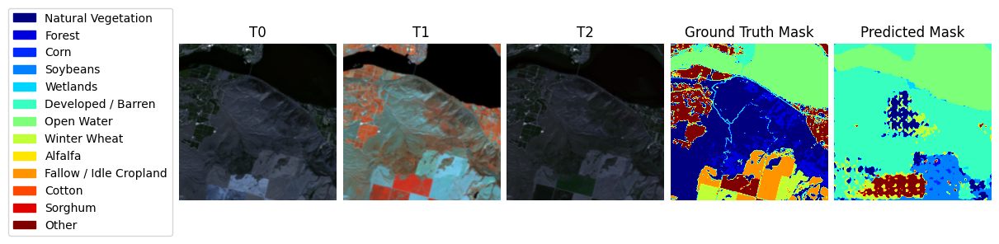

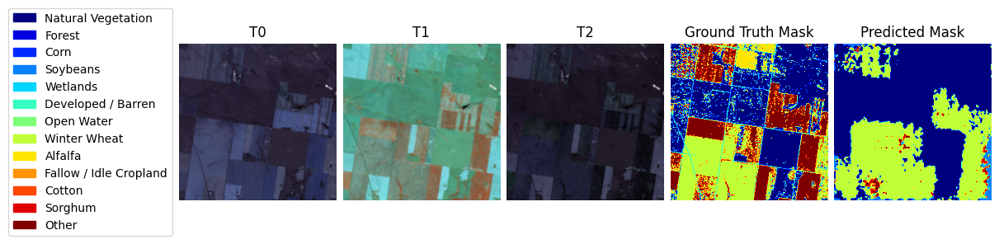

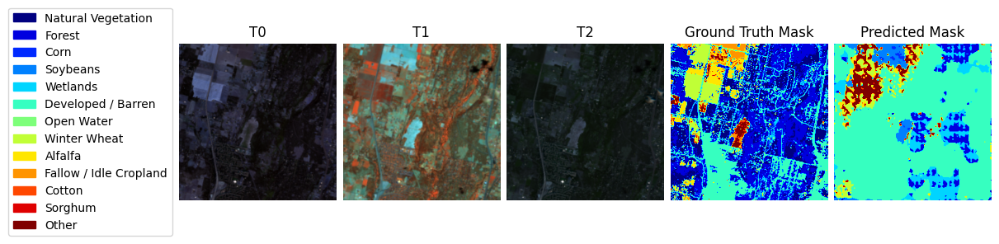

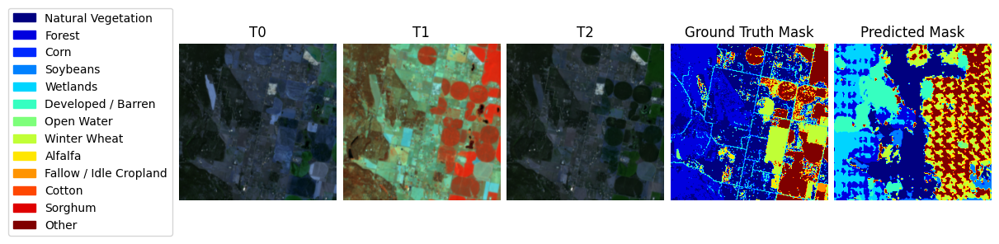

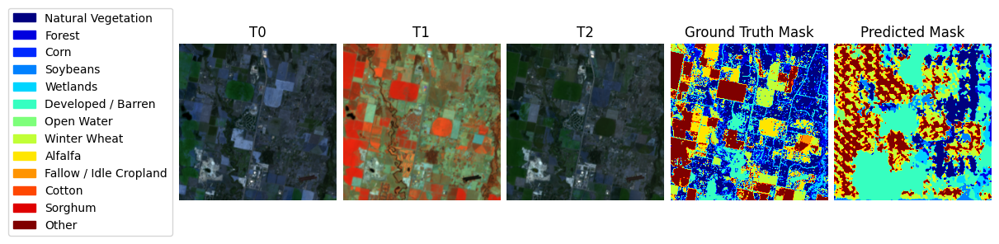

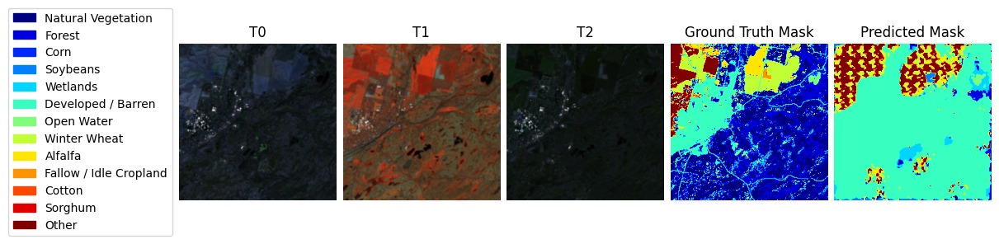

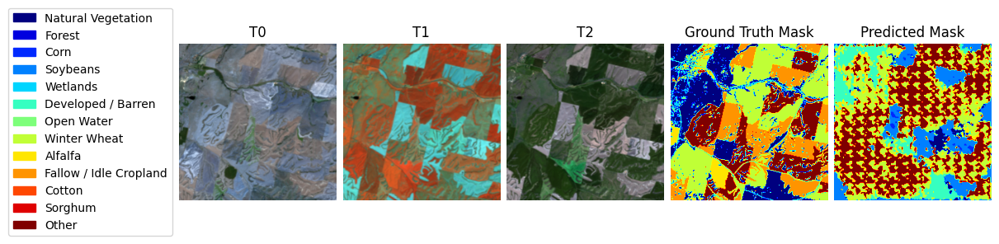

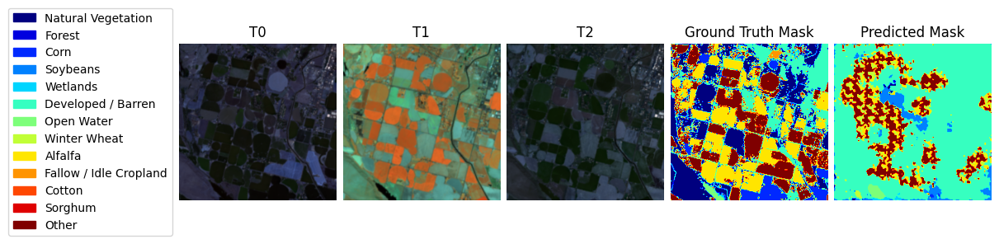

In [31]:
run_test_and_plot(model, best_ckpt_path)

In [25]:
best_ckpt_100_epoch_path = "multicrop_best-epoch=76.ckpt"

if not os.path.isfile(best_ckpt_100_epoch_path):
    gdown.download("https://drive.google.com/uc?id=1cO5a9PmV70j6mvlTc8zH8MnKsRCGbefm")


Downloading...
From (original): https://drive.google.com/uc?id=1cO5a9PmV70j6mvlTc8zH8MnKsRCGbefm
From (redirected): https://drive.google.com/uc?id=1cO5a9PmV70j6mvlTc8zH8MnKsRCGbefm&confirm=t&uuid=4c5c9a3b-9364-4bec-9b4c-b60523b0073b
To: /opt/app-root/src/terratorch/examples/tutorials/PrithviEOv2/multicrop_best-epoch=76.ckpt
100%|██████████| 2.18G/2.18G [00:29<00:00, 72.6MB/s]


Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt


Output()

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃             Test metric             ┃            DataLoader 0             ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      test/Multiclass_Accuracy       │         0.5600684881210327          │
│      test/Multiclass_F1_Score       │         0.5600684881210327          │
│    test/Multiclass_Jaccard_Index    │         0.37729722261428833         │
│ test/Multiclass_Jaccard_Index_Micro │         0.3889549672603607          │
│              test/loss              │         1.3243143558502197          │
│      test/multiclassaccuracy_0      │         0.7489197850227356          │
│      test/multiclassaccuracy_1      │         0.6185186505317688          │
│     test/multiclassaccuracy_10      │         0.34061095118522644         │
│     test/multiclassaccuracy_11      │         0.5059535503387451          │
│     test/multiclassaccuracy_12      │         0.3451700210571289          │
│      test/multiclassaccuracy_2      │         0.6034638285636902          │
│      test/multiclassaccuracy_3      │         0.4781585931777954          │
│      test/multiclassaccuracy_4      │         0.5392929911613464          │
│      test/multiclassaccuracy_5      │         0.39116817712783813         │
│      test/multiclassaccuracy_6      │         0.7621328234672546          │
│      test/multiclassaccuracy_7      │          0.605463981628418          │
│      test/multiclassaccuracy_8      │         0.4047829210758209          │
│      test/multiclassaccuracy_9      │         0.5014184713363647          │
│    test/multiclassjaccardindex_0    │         0.45867636799812317         │
│    test/multiclassjaccardindex_1    │         0.4343545734882355          │
│   test/multiclassjaccardindex_10    │         0.24672310054302216         │
│   test/multiclassjaccardindex_11    │          0.354764461517334          │
│   test/multiclassjaccardindex_12    │         0.2572464346885681          │
│    test/multiclassjaccardindex_2    │         0.44797074794769287         │
│    test/multiclassjaccardindex_3    │         0.3391176164150238          │
│    test/multiclassjaccardindex_4    │         0.3926903009414673          │
│    test/multiclassjaccardindex_5    │         0.2909499704837799          │
│    test/multiclassjaccardindex_6    │         0.6637320518493652          │
│    test/multiclassjaccardindex_7    │         0.43042105436325073         │
│    test/multiclassjaccardindex_8    │         0.2525438070297241          │
│    test/multiclassjaccardindex_9    │         0.3356732726097107          │
└─────────────────────────────────────┴─────────────────────────────────────┘

Restoring states from the checkpoint path at multicrop_best-epoch=76.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from the checkpoint at multicrop_best-epoch=76.ckpt


Output()

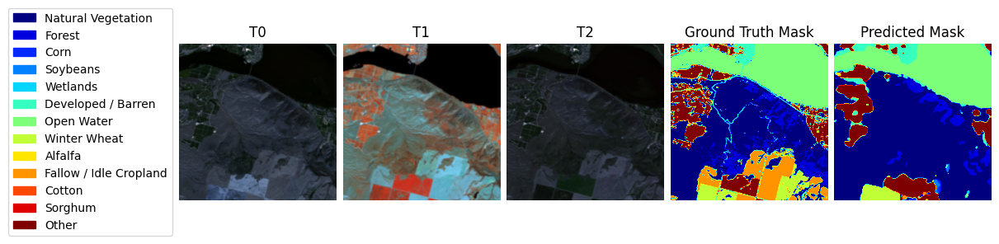

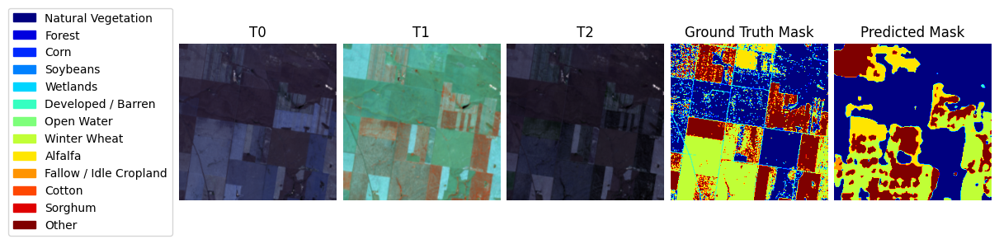

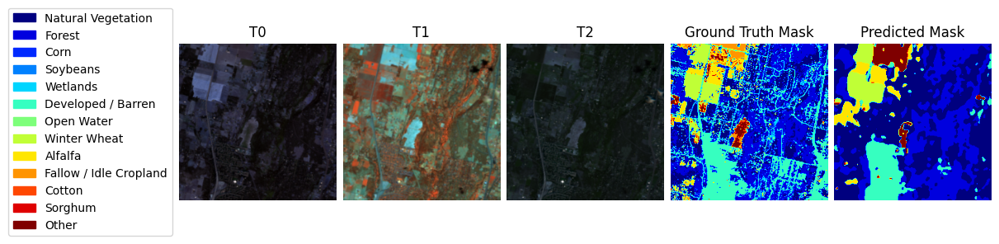

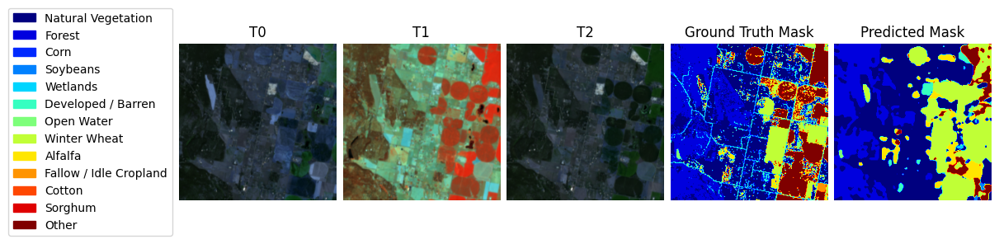

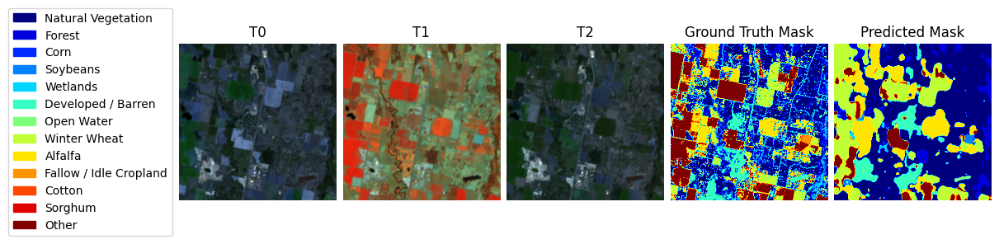

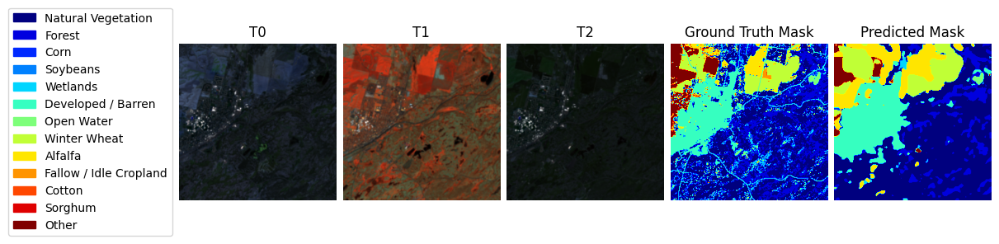

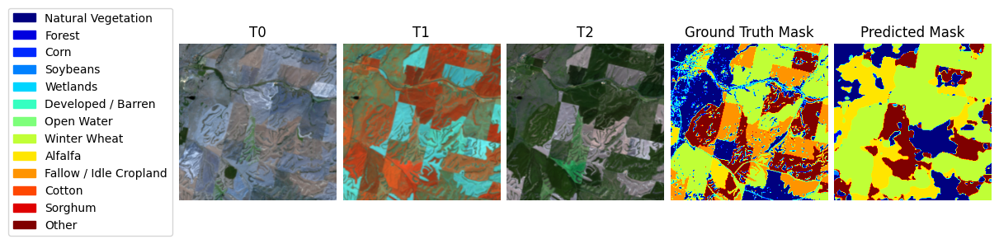

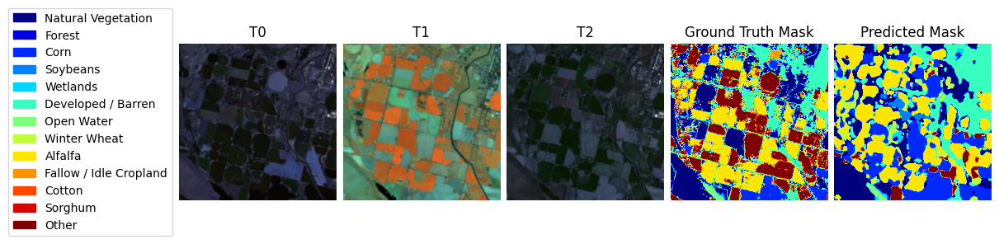

In [32]:
run_test_and_plot(model, best_ckpt_100_epoch_path)

# Fine-tuning via CLI

You might want to restart the session to free up GPU memory.

In [ ]:
# Run fine-tuning
!terratorch fit -c prithvi_v2_eo_300_tl_unet_multitemporal_crop.yaml